In [ ]:
import os
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from skimage.filters import threshold_otsu
import tifffile as tiff


class NIRDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, folder_path, batch_size=8, img_size=(256, 256)):
        self.folder_path = folder_path
        self.file_list = []
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                if file.lower().endswith(('.tif', '.tiff', '.jpg', '.jpeg', '.png')):
                    self.file_list.append(os.path.join(root, file))
        self.batch_size = batch_size
        self.img_size = img_size
        print(f"Found {len(self.file_list)} images in {folder_path}")  

    def __len__(self):
        return int(np.ceil(len(self.file_list) / self.batch_size))

    def __getitem__(self, idx):
        batch_files = self.file_list[idx * self.batch_size : (idx + 1) * self.batch_size]
        batch_images = []
        batch_masks = []

        for img_path in batch_files:
            if img_path.lower().endswith(('.tif', '.tiff')):
                image = tiff.imread(img_path)
            else:
                image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

            if image is None:
                print(f"Failed to load image: {img_path}")
                continue

            if len(image.shape) == 3:
                nir_band = image[-1]
            else:
                nir_band = image

            nir_norm = cv2.normalize(nir_band, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
            nir_resized = cv2.resize(nir_norm, self.img_size) / 255.0

            
            thresh = threshold_otsu(nir_norm)
            mask = (nir_norm < thresh).astype(np.uint8)
            mask_resized = cv2.resize(mask, self.img_size)

            batch_images.append(nir_resized[..., np.newaxis])
            batch_masks.append(mask_resized[..., np.newaxis])

        return np.array(batch_images), np.array(batch_masks)


def build_cnn_segmentation(input_shape):
    model = Sequential()

    model.add(Conv2D(32, (3,3), activation='relu', padding='same', input_shape=input_shape))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(BatchNormalization())
    model.add(MaxPooling2D((2,2)))

    model.add(Conv2D(128, (3,3), activation='relu', padding='same'))
    model.add(BatchNormalization())

    model.add(UpSampling2D((2,2)))
    model.add(Conv2D(64, (3,3), activation='relu', padding='same'))
    model.add(BatchNormalization())

    model.add(UpSampling2D((2,2)))
    model.add(Conv2D(32, (3,3), activation='relu', padding='same'))
    model.add(BatchNormalization())

    model.add(Conv2D(1, (1,1), activation='sigmoid', padding='same'))

    return model


dataset_path = r"C:\Users\quant\ULOG3\dataset_split"  # Change this to your path
batch_size = 8
img_size = (256, 256)


train_gen = NIRDataGenerator(dataset_path, batch_size=batch_size, img_size=img_size)


model = build_cnn_segmentation((256, 256, 1))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


early_stop = EarlyStopping(monitor='loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=5)


model.fit(train_gen, epochs=10, callbacks=[early_stop, reduce_lr])


model.save("WaterLand_Segmentation_CNN_Only.h5")
print("Model Saved Successfully.")


ModuleNotFoundError: No module named 'skimage'

[1/50] Selected Test Image: sentinel_4_682_low_density_129.15803591800096_32.973130417678234.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


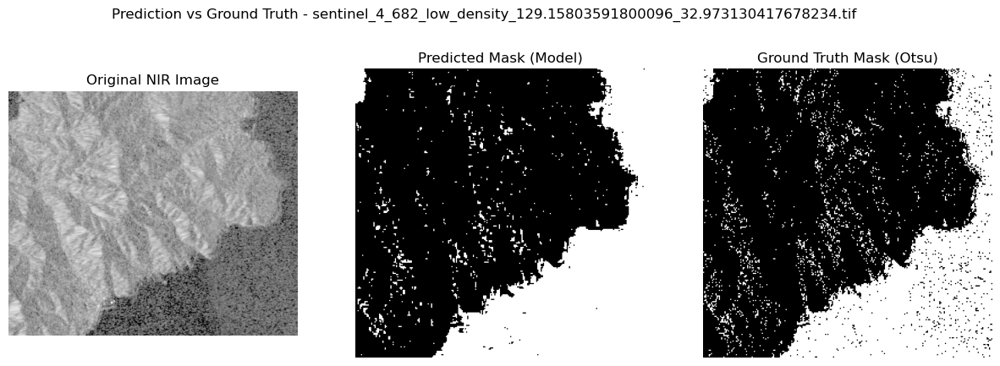

[2/50] Selected Test Image: sentinel_1_468_inhabited_-68.69195676811682_18.15893991118136.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


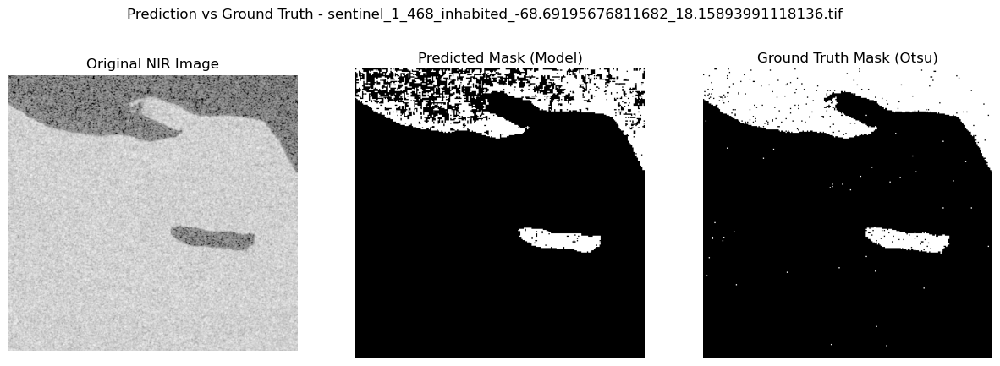

[3/50] Selected Test Image: sentinel_13_821_inhabited_57.67932827372471_19.751338406579524.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


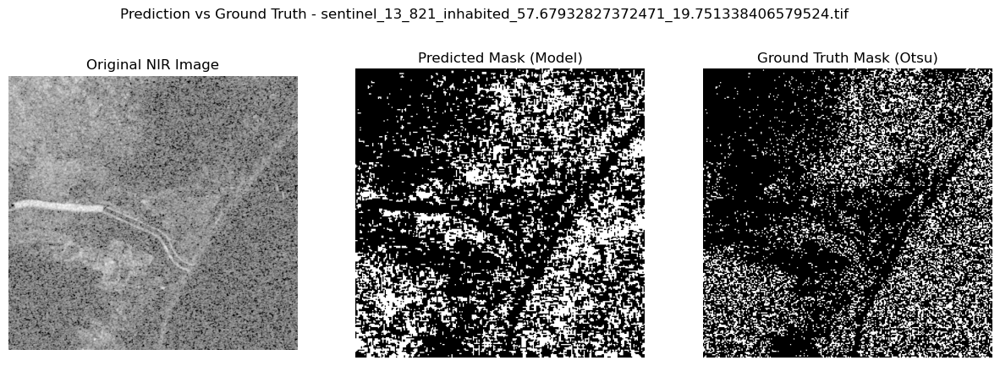

[4/50] Selected Test Image: sentinel_1_473_rural_-64.23202186277395_-0.40633558349525567.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


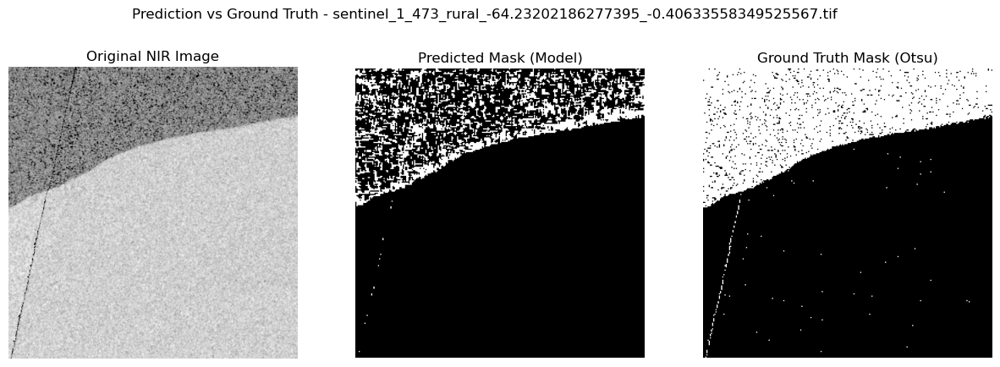

[5/50] Selected Test Image: sentinel_1_478_inhabited_-73.85929684188152_9.106251316517678.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


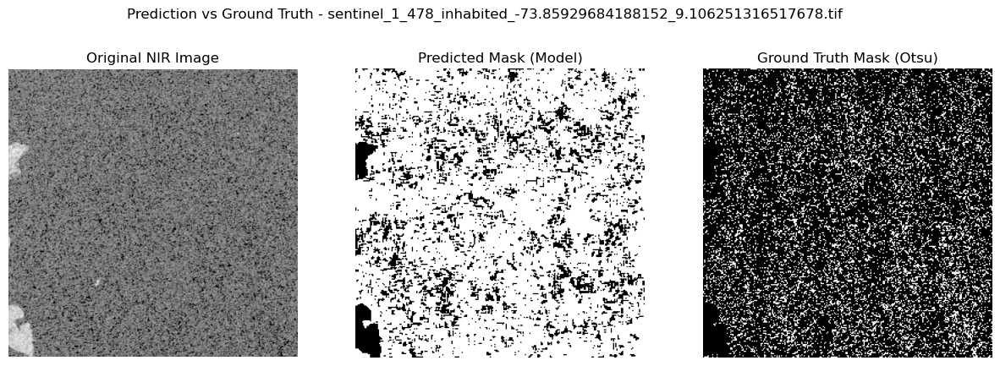

[6/50] Selected Test Image: sentinel_6_375_inhabited_-162.04167217753653_67.04616945580575.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


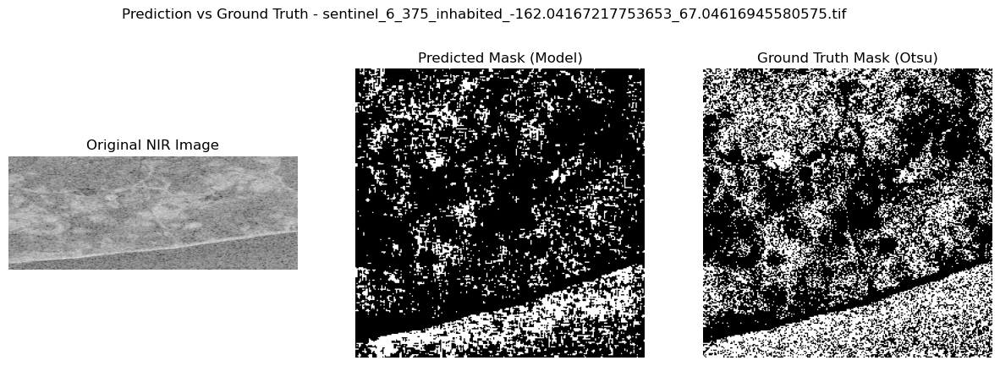

[7/50] Selected Test Image: sentinel_4_686_rural_6.944858149396658_46.981976060215416.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


C:\Users\quant\AppData\Local\Temp\ipykernel_6224\2364741594.py:43: RuntimeWarning: invalid value encountered in cast
  nir_norm = cv2.normalize(nir_band, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


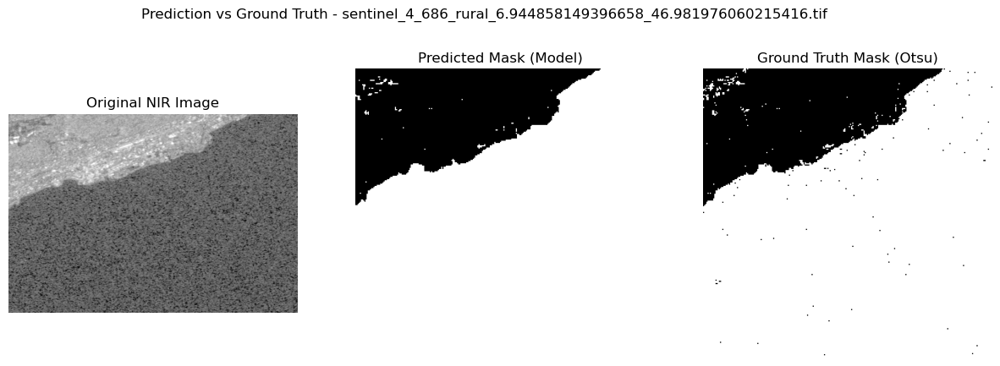

[8/50] Selected Test Image: sentinel_4_172_rural_168.5092593638797_-46.59902846174547.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


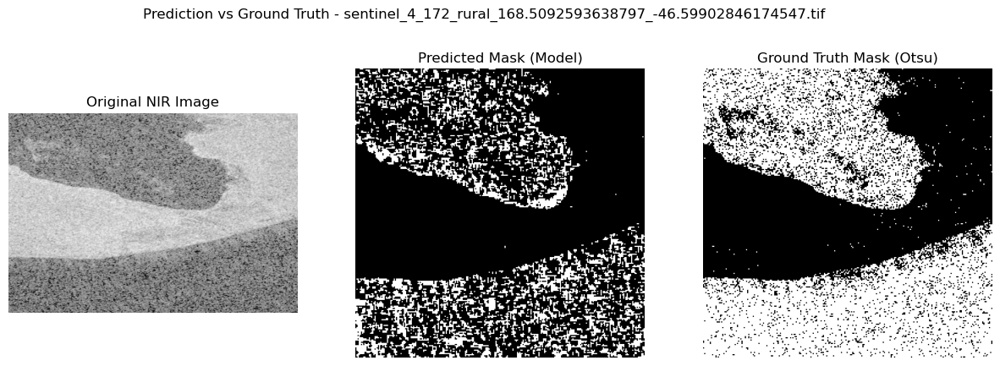

[9/50] Selected Test Image: sentinel_10_589_inhabited_-69.26971803251075_-15.653179287904821.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


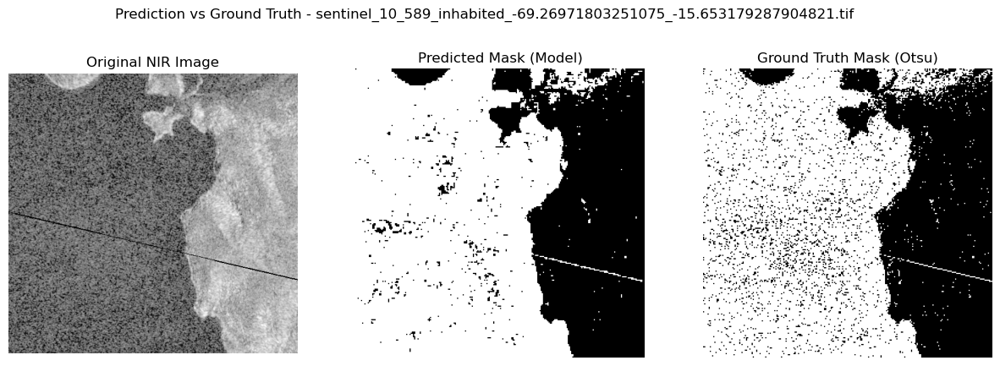

[10/50] Selected Test Image: sentinel_1_278_low_density_99.16129748518414_3.5295345523392836.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


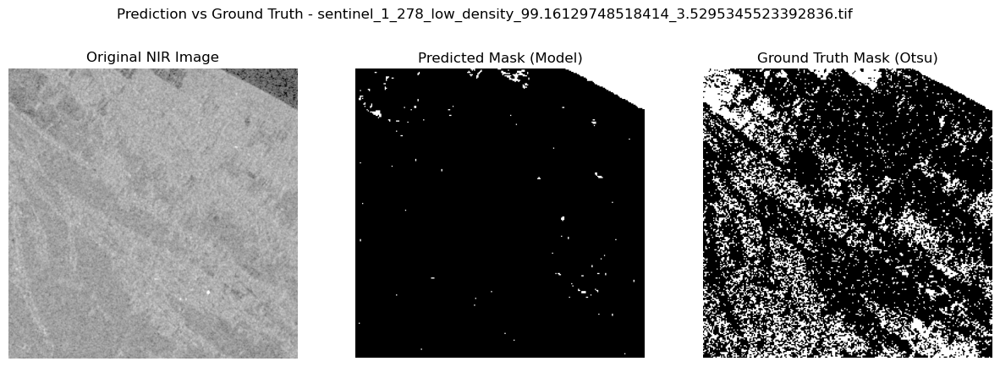

[11/50] Selected Test Image: sentinel_1_231_low_density_123.30544348984797_9.286390080874783.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


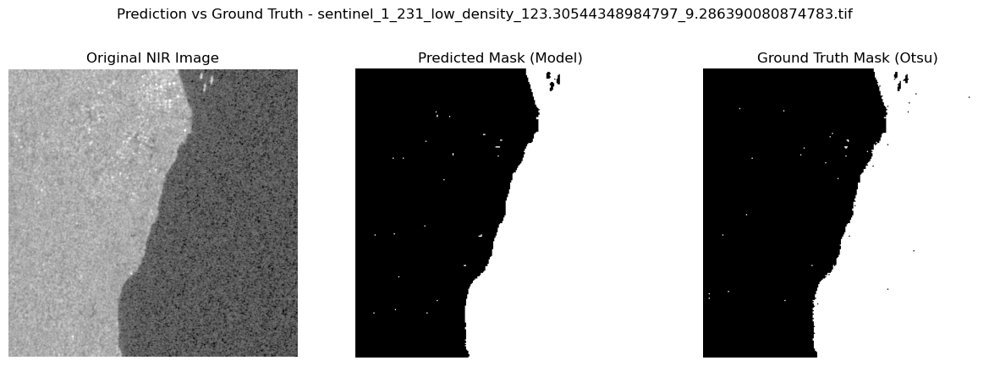

[12/50] Selected Test Image: sentinel_12_789_high_density_25.16105737720532_35.32987234284967.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


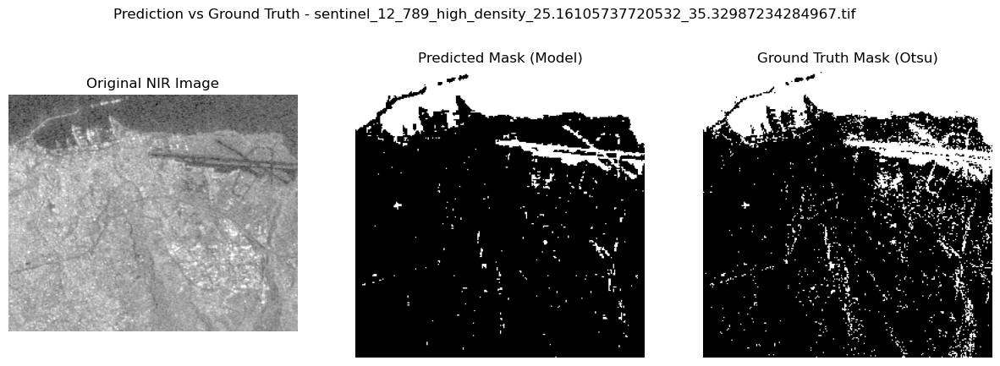

[13/50] Selected Test Image: sentinel_4_661_low_density_49.34845220298651_55.174133956281956.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


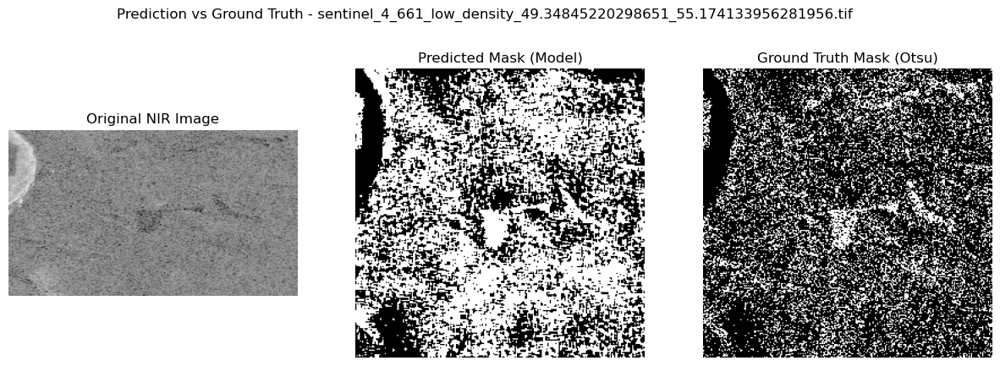

[14/50] Selected Test Image: sentinel_1_450_inhabited_-83.19271260246592_15.007639687498516.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


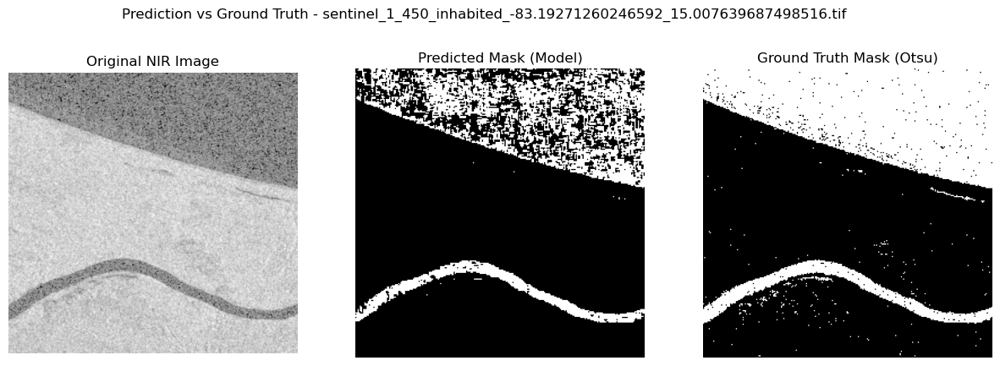

[15/50] Selected Test Image: sentinel_1_11_rural_-0.12052504237358863_6.494511238503891.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


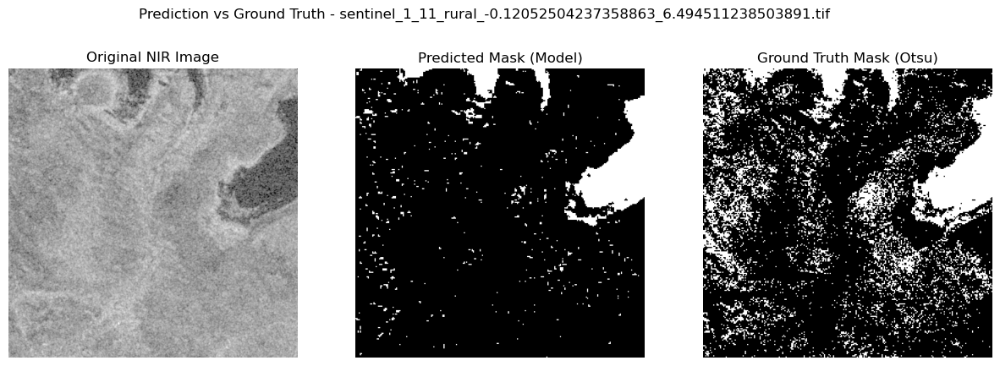

[16/50] Selected Test Image: sentinel_4_651_high_density_-1.3351262010185512_54.84937762655949.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


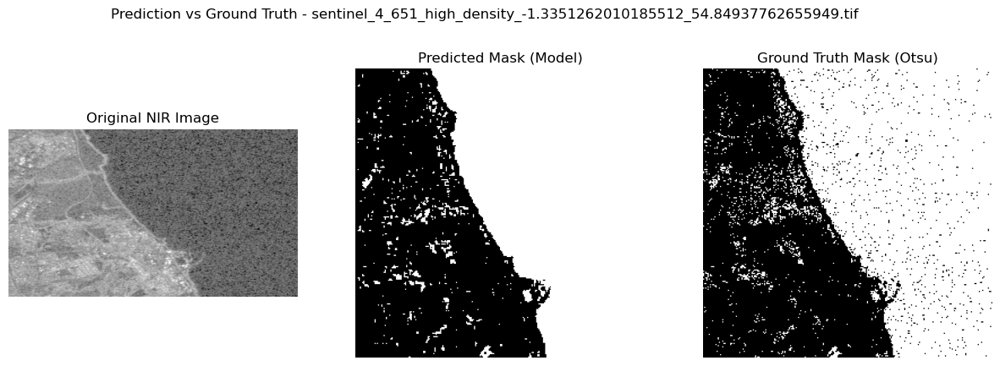

[17/50] Selected Test Image: sentinel_8_578_rural_-61.28873870323436_-51.75251410853711.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


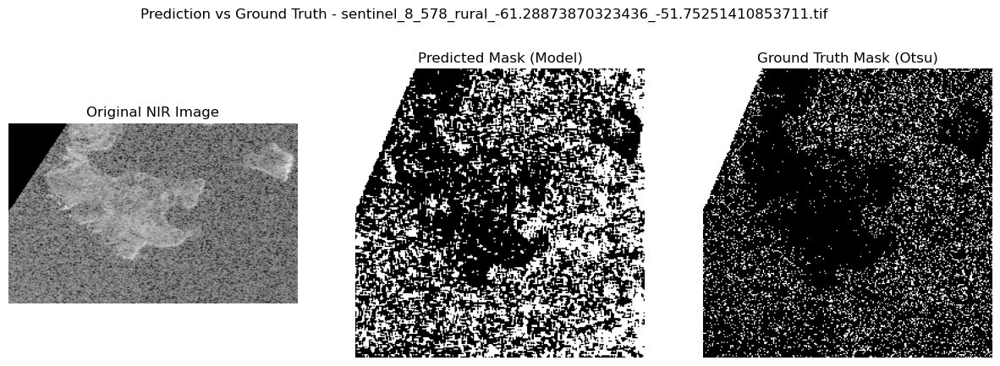

[18/50] Selected Test Image: sentinel_1_473_rural_-64.23202186277395_-0.40633558349525567.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


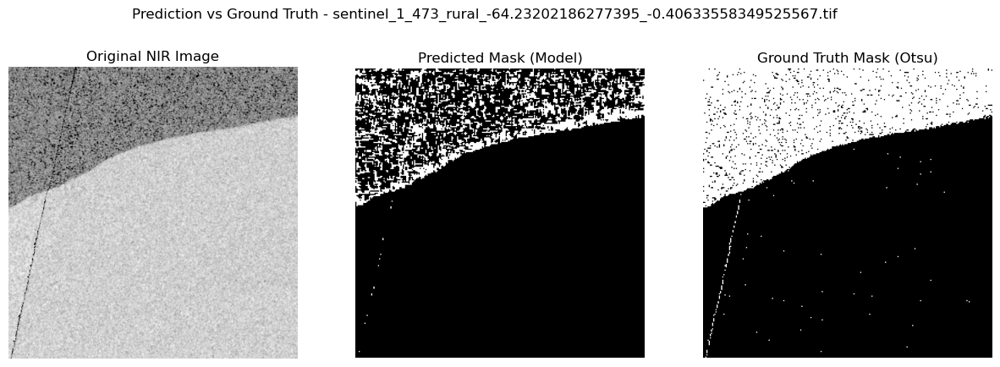

[19/50] Selected Test Image: sentinel_1_480_rural_-48.88971326391116_-1.587484566037267.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


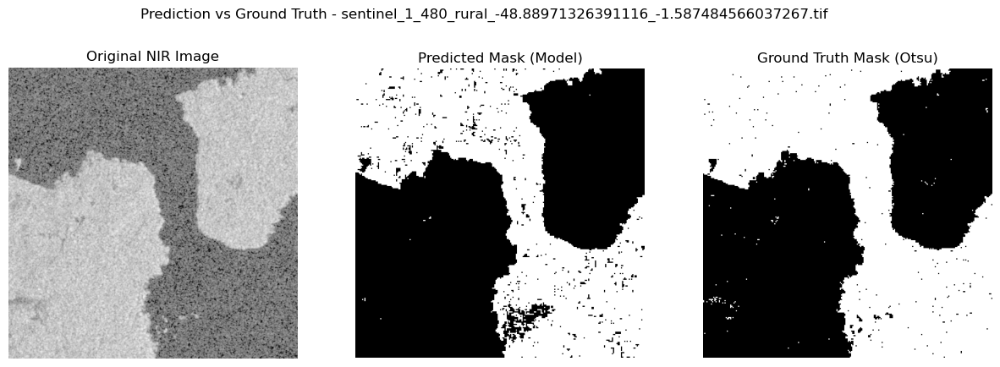

[20/50] Selected Test Image: sentinel_6_716_inhabited_142.69589347086895_48.39927457544687.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


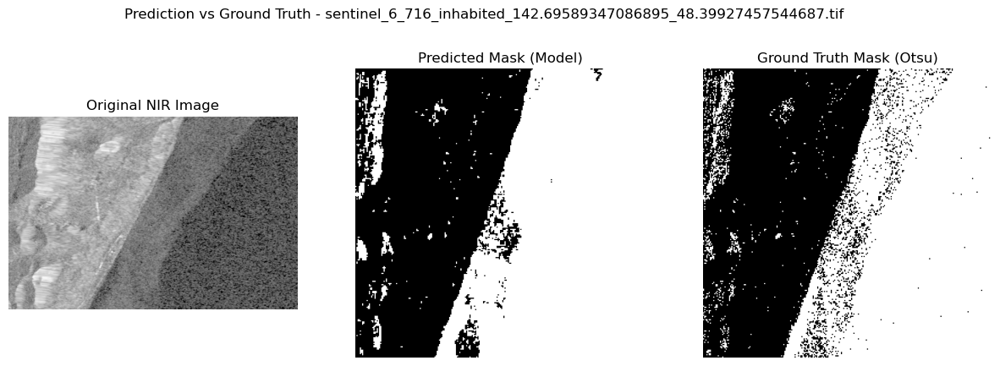

[21/50] Selected Test Image: sentinel_1_247_rural_125.78738359529702_11.002461743990267.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


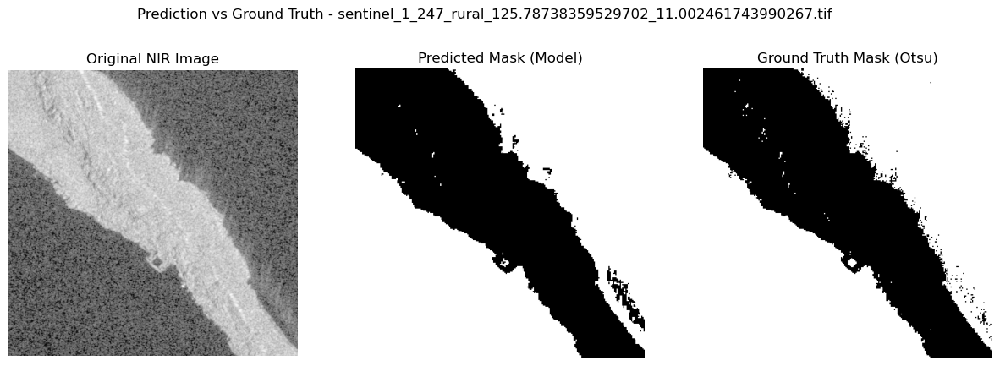

[22/50] Selected Test Image: sentinel_4_177_inhabited_146.70077265460662_-41.843102887575924.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


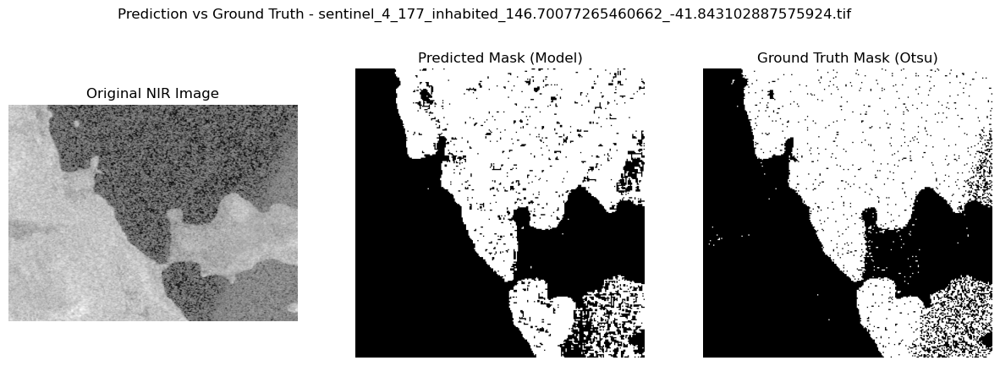

[23/50] Selected Test Image: sentinel_6_718_inhabited_108.55502704661747_53.60667967217676.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


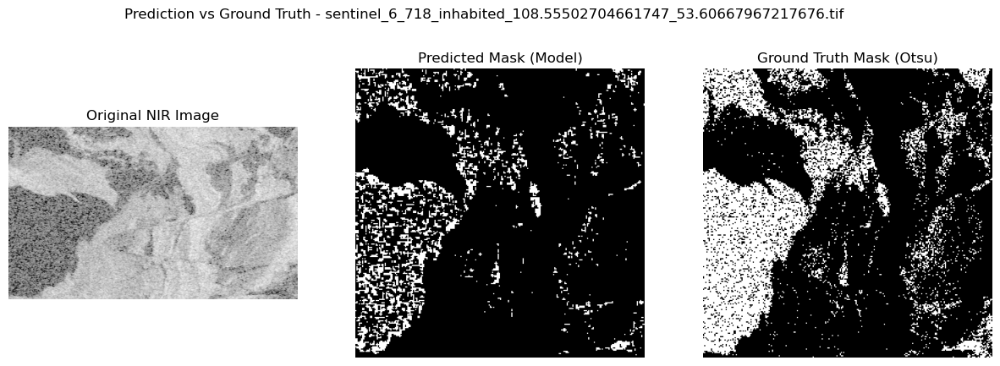

[24/50] Selected Test Image: sentinel_8_578_rural_-61.28873870323436_-51.75251410853711.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


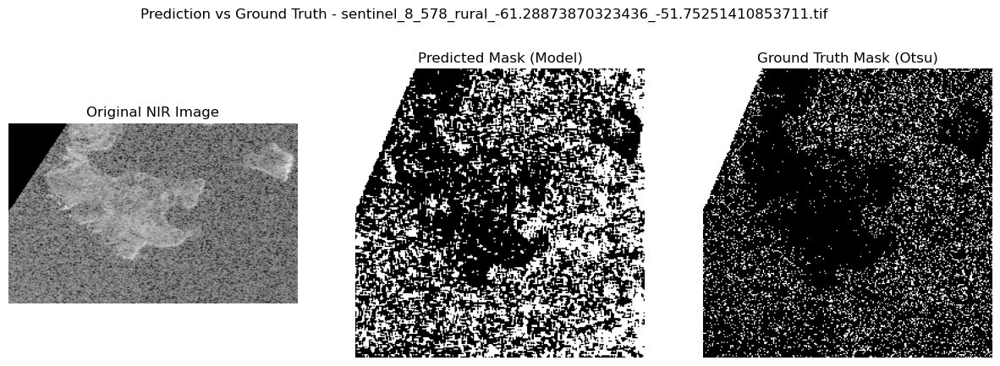

[25/50] Selected Test Image: sentinel_13_105_inhabited_52.22514314739394_12.206419028420656.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


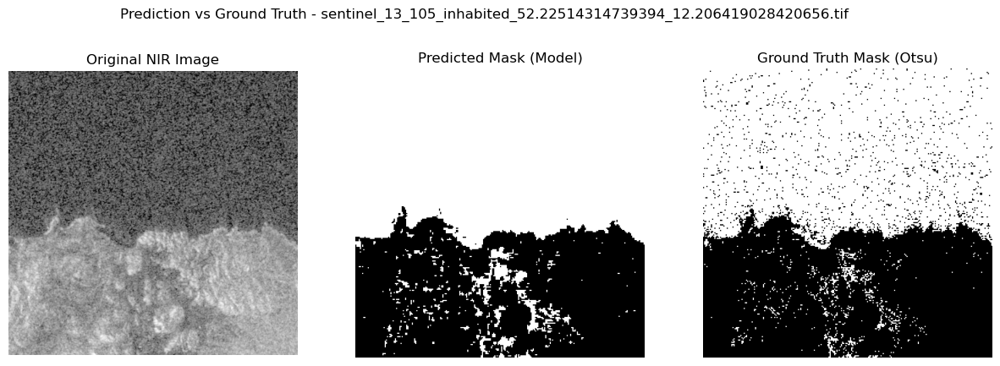

[26/50] Selected Test Image: sentinel_12_806_high_density_13.396758218233817_38.085253443098104.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


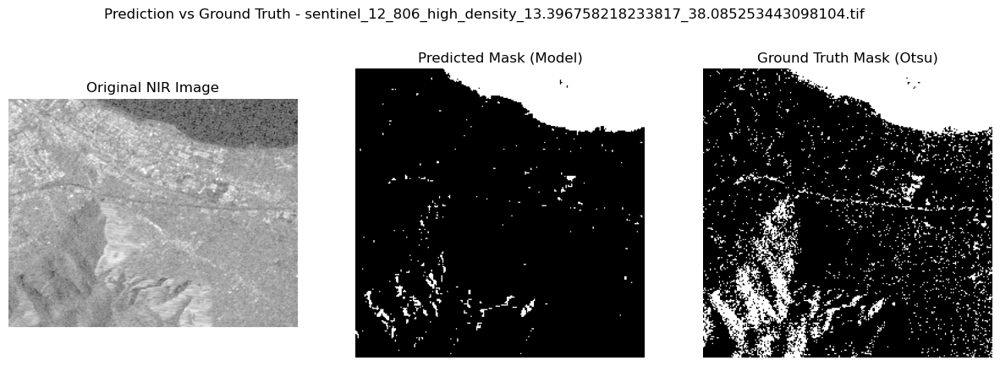

[27/50] Selected Test Image: sentinel_13_431_inhabited_-111.05602089086788_25.70340892013383.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


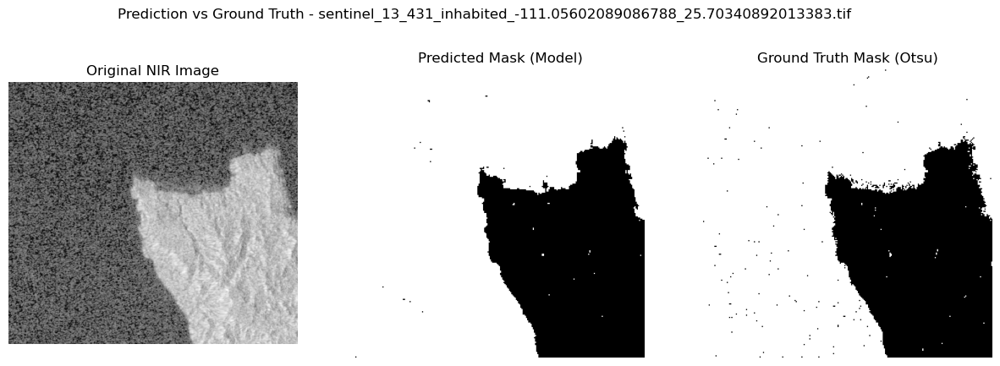

[28/50] Selected Test Image: sentinel_4_685_rural_131.89133109073165_42.96269398007511.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step


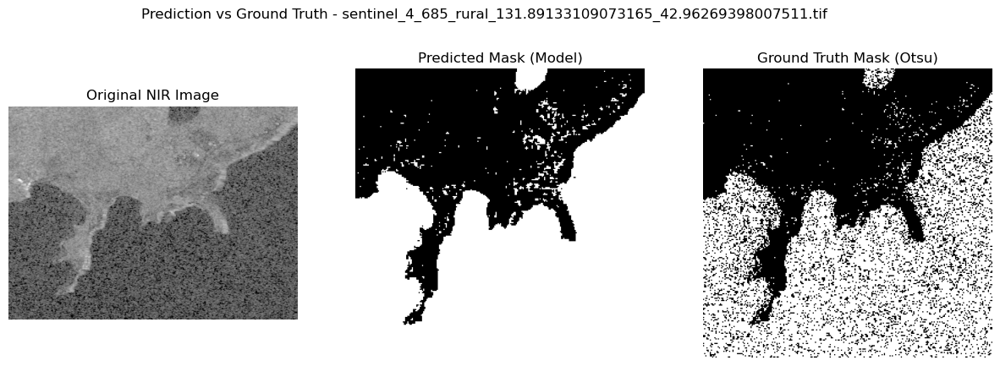

[29/50] Selected Test Image: sentinel_2_528_inhabited_-92.32867045020168_16.03037464601581.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


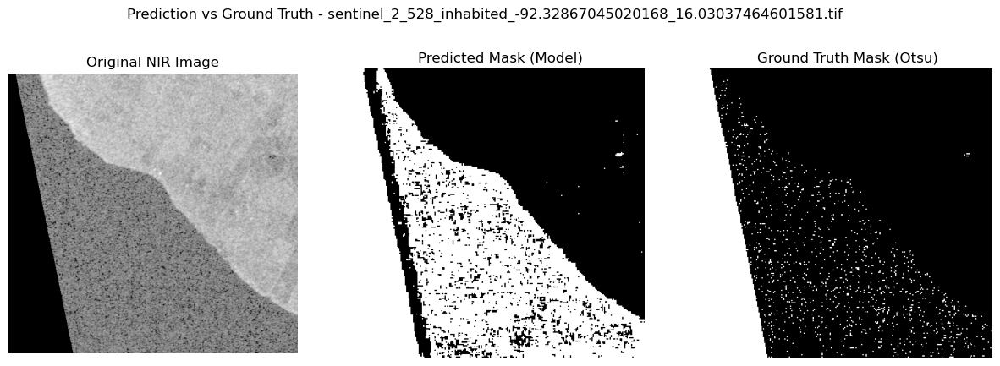

[30/50] Selected Test Image: sentinel_1_625_inhabited_-140.16228130241257_-8.811121254194308.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


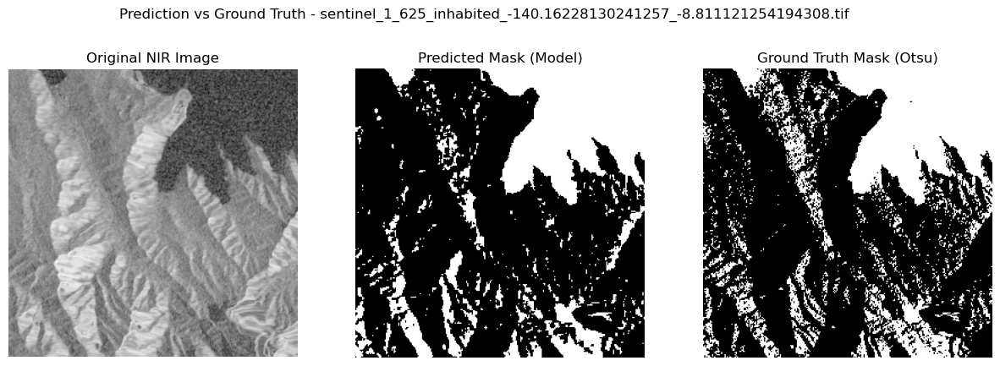

[31/50] Selected Test Image: sentinel_13_601_inhabited_-90.44359439805953_0.35473486610478006.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


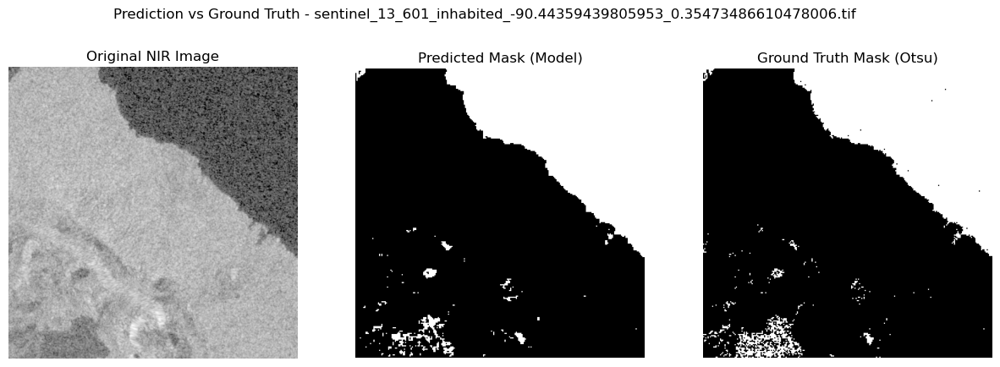

[32/50] Selected Test Image: sentinel_13_316_rural_81.34881188945131_16.32315030298296.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step


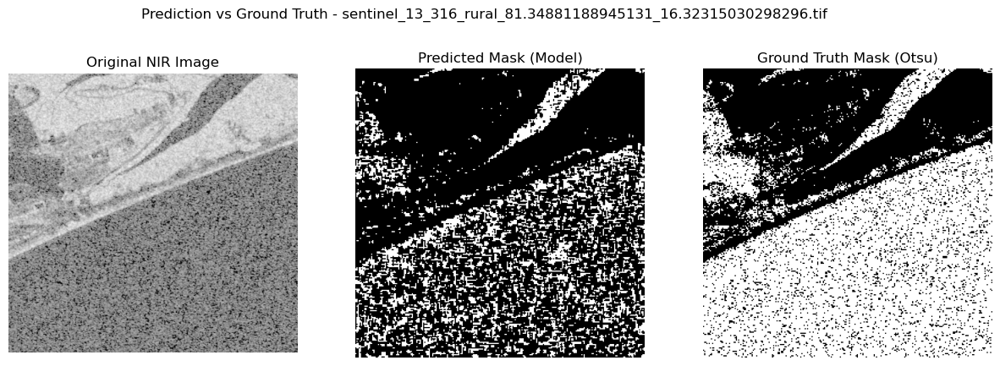

[33/50] Selected Test Image: sentinel_4_669_rural_129.65915415348826_41.553591292579895.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


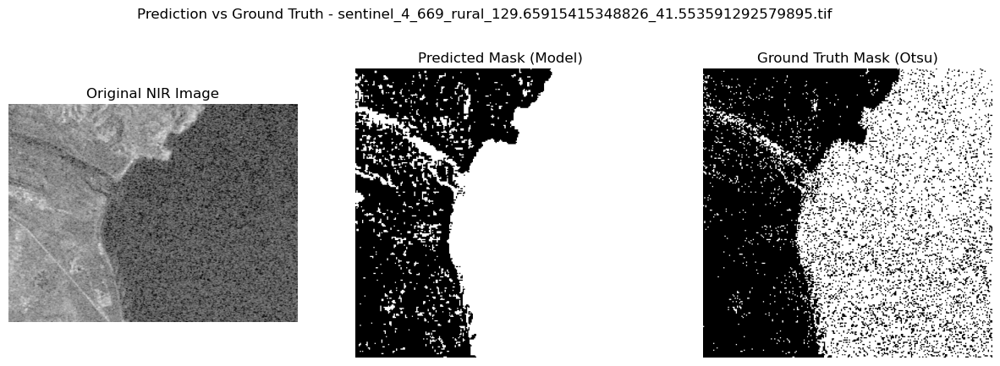

[34/50] Selected Test Image: sentinel_7_44_low_density_2.415535172561113_6.482832852844917.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


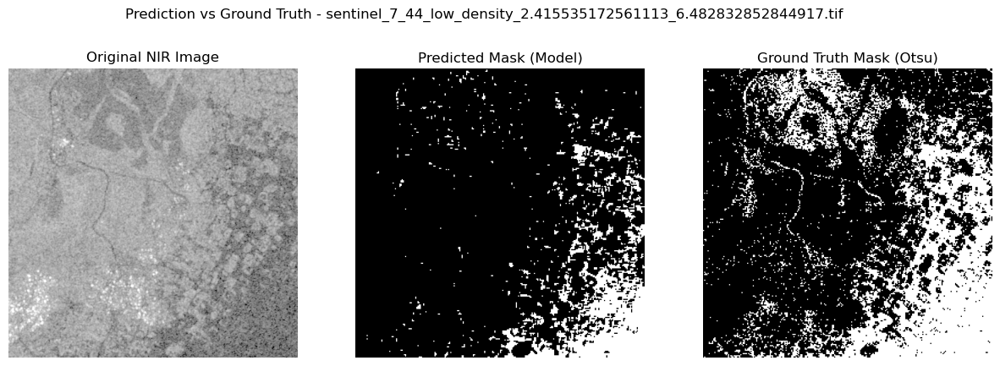

[35/50] Selected Test Image: sentinel_9_581_rural_-80.1456037339979_25.744165103762327.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


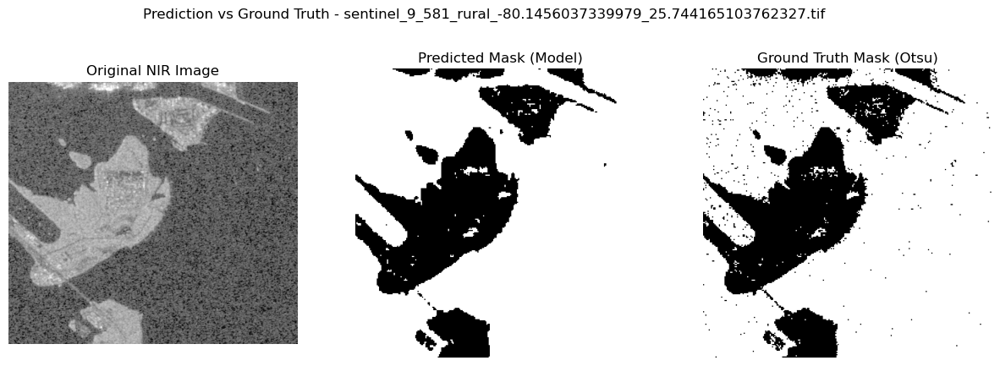

[36/50] Selected Test Image: sentinel_1_20_rural_55.747614483664584_-21.027287877517793.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


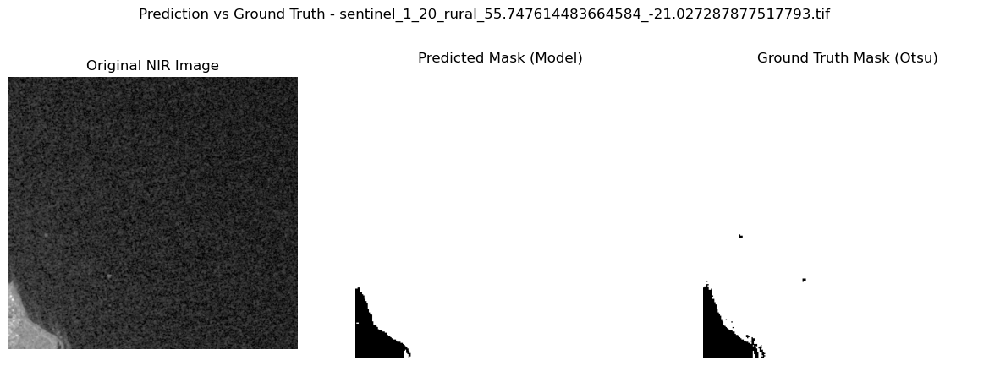

[37/50] Selected Test Image: sentinel_1_4_rural_45.19108514052415_-12.88434507977814.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


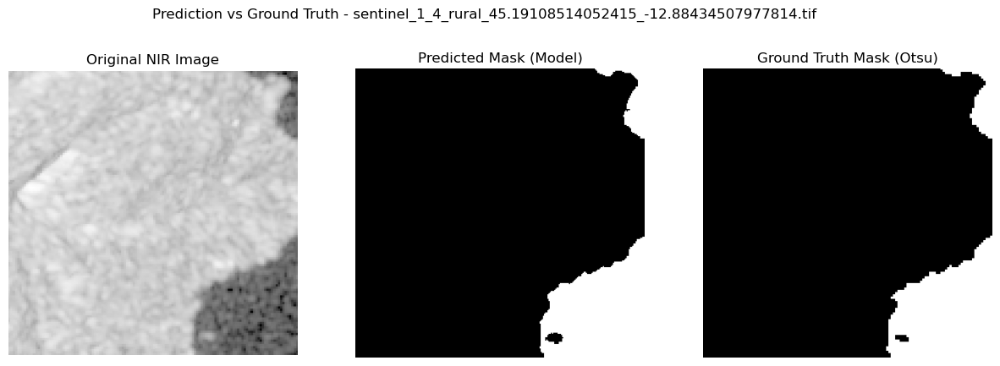

[38/50] Selected Test Image: sentinel_1_236_rural_119.64063318885032_25.37944631039888.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step


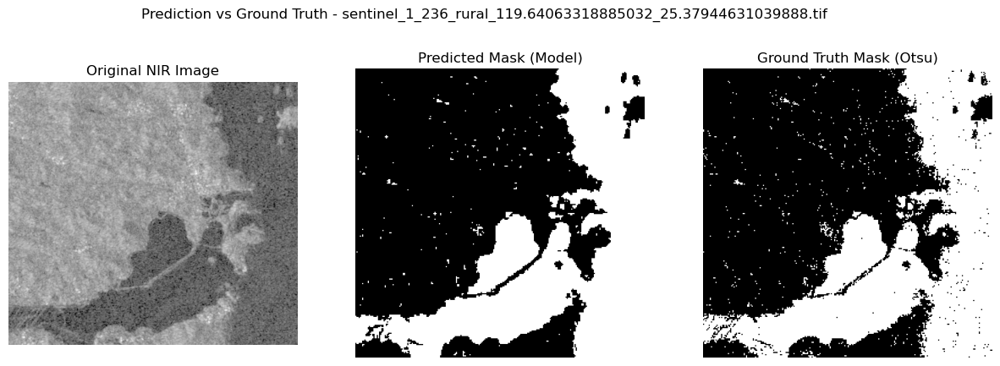

[39/50] Selected Test Image: sentinel_8_724_inhabited_84.18819799444562_49.19179506477684.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


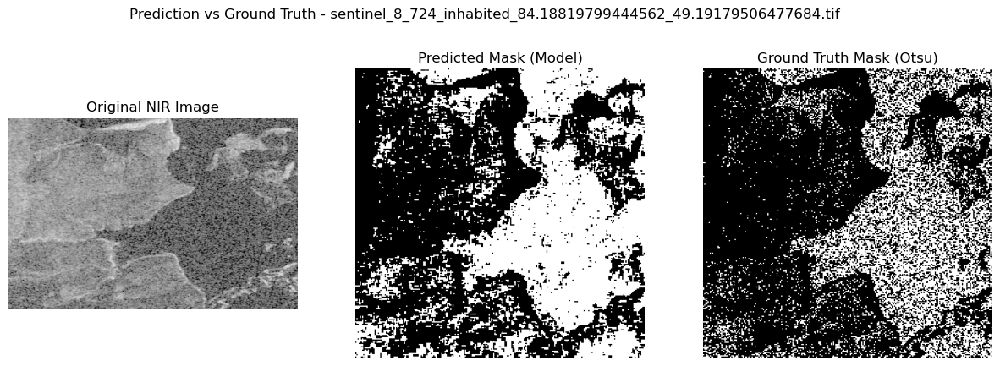

[40/50] Selected Test Image: sentinel_4_681_rural_127.83456134803505_34.8421982970385.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


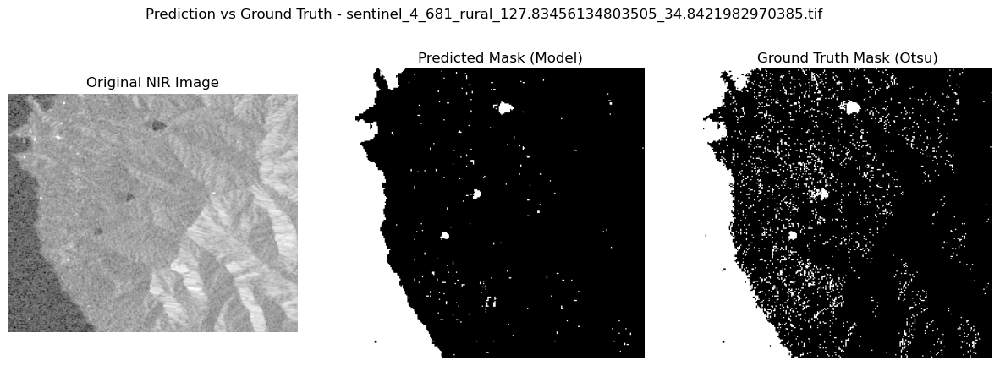

[41/50] Selected Test Image: sentinel_14_616_low_density_-48.50788935890669_-27.56044168575085.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step


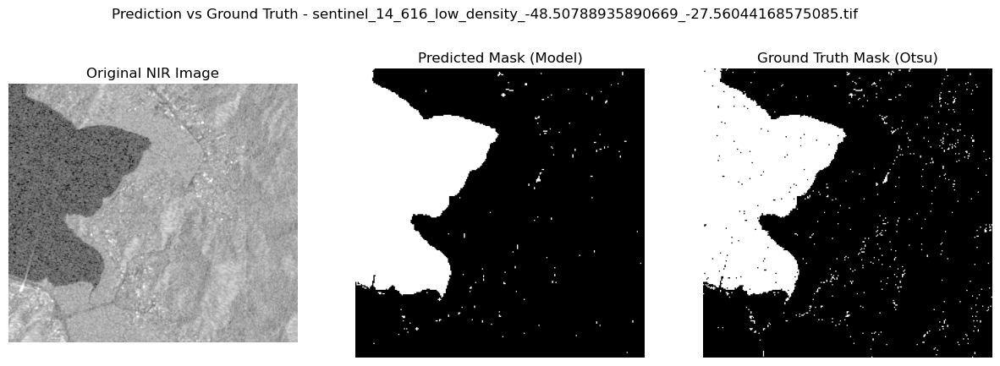

[42/50] Selected Test Image: sentinel_4_686_rural_6.944858149396658_46.981976060215416.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


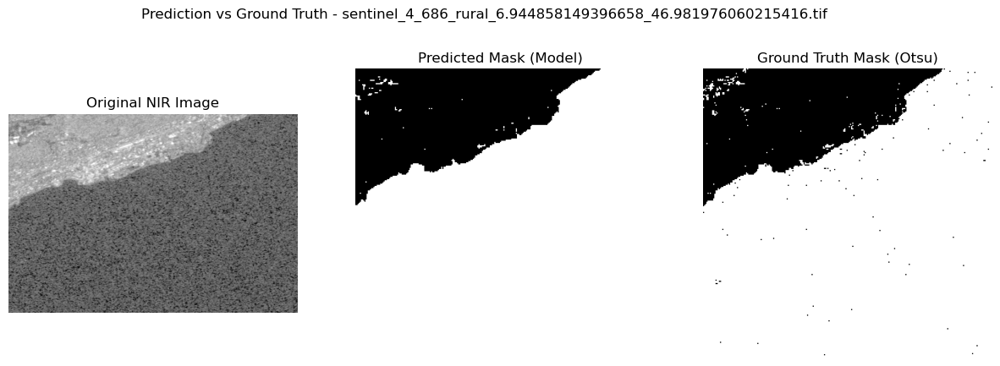

[43/50] Selected Test Image: sentinel_1_231_low_density_123.30544348984797_9.286390080874783.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


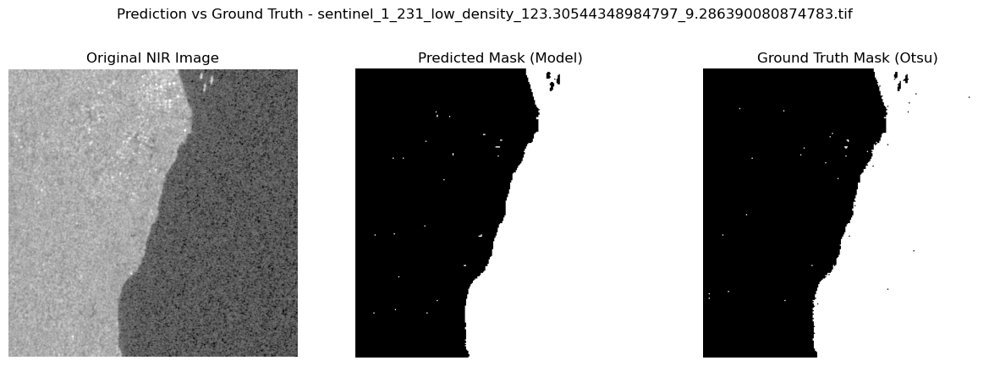

[44/50] Selected Test Image: sentinel_14_616_low_density_-48.50788935890669_-27.56044168575085.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step


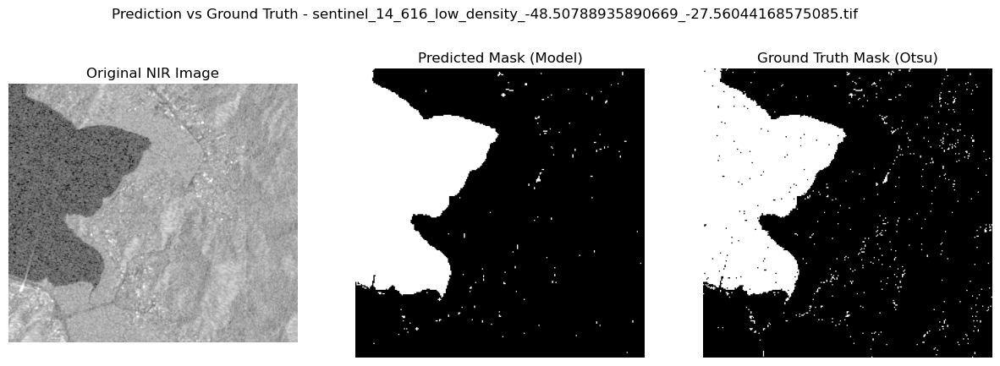

[45/50] Selected Test Image: sentinel_13_830_inhabited_43.28201020651237_33.96244887290101.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


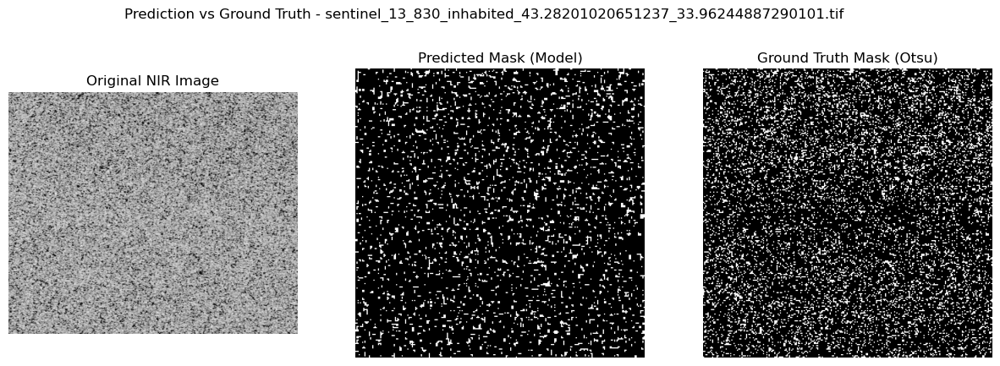

[46/50] Selected Test Image: sentinel_7_384_rural_-95.03337832607873_29.150530366803324.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step


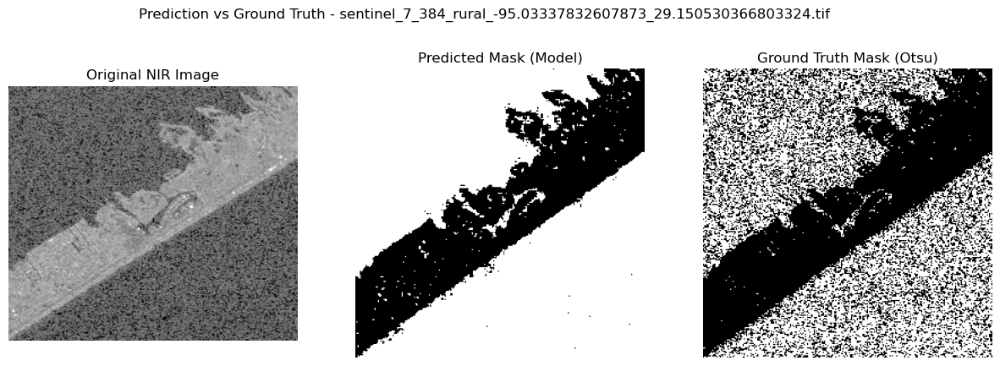

[47/50] Selected Test Image: sentinel_11_782_inhabited_112.31417408950186_54.79577031369496.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


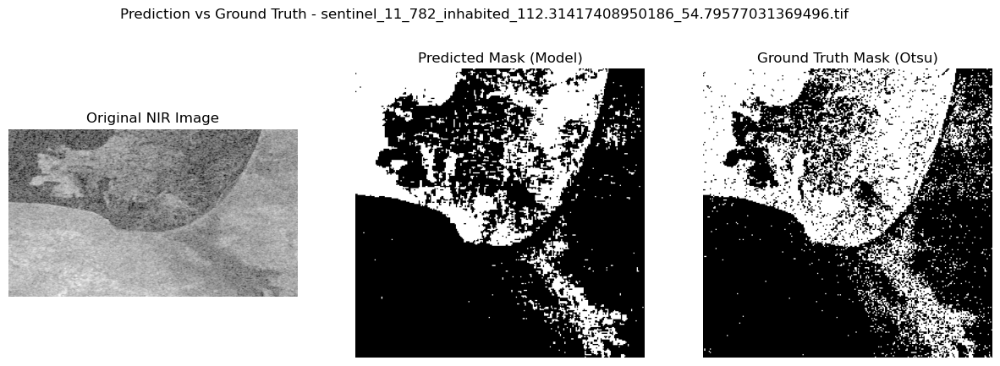

[48/50] Selected Test Image: sentinel_8_192_inhabited_147.05906588335205_-36.16927136155453.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


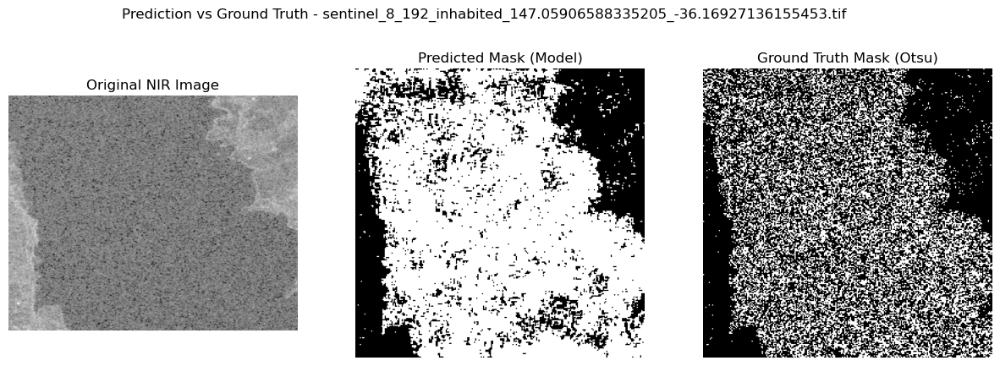

[49/50] Selected Test Image: sentinel_4_646_inhabited_27.627337119754642_42.585008120848244.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step


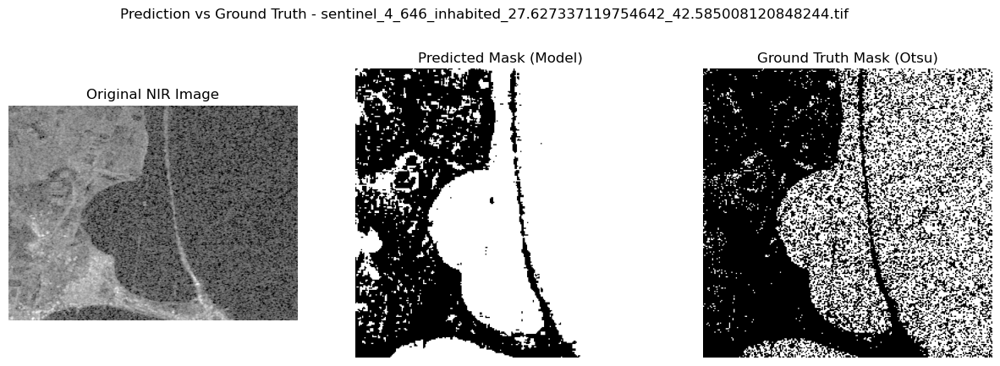

[50/50] Selected Test Image: sentinel_4_177_inhabited_146.70077265460662_-41.843102887575924.tif
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step


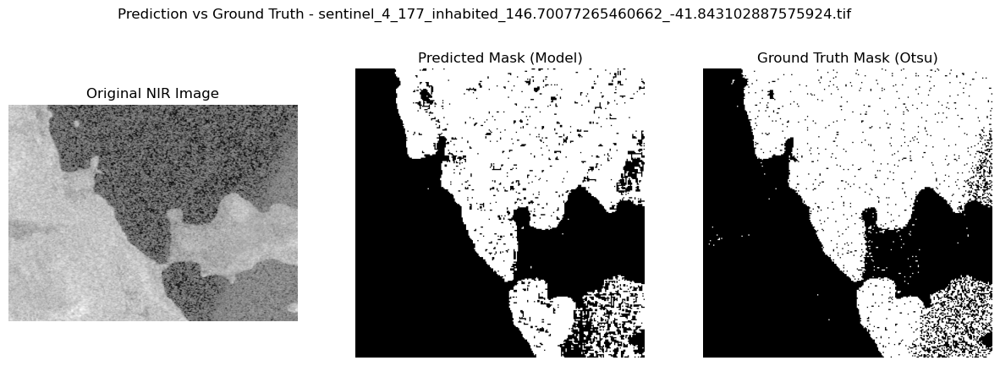

In [ ]:
import os
import random
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu
import tifffile as tiff
import cv2
import numpy as np


test_folder = r"C:\Users\quant\ULOG3\dataset_split\test\water"  
test_images = [f for f in os.listdir(test_folder) if f.lower().endswith(('.tif', '.tiff', '.jpg', '.jpeg', '.png'))]


num_images = 50

for i in range(num_images):
    random_file = random.choice(test_images)
    image_path = os.path.join(test_folder, random_file)

    print(f"[{i+1}/{num_images}] Selected Test Image: {random_file}")

    
    if random_file.lower().endswith(('.tif', '.tiff')):
        image = tiff.imread(image_path)
    else:
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    if image is None:
        print("Failed to load image:", random_file)
        continue

    
    if len(image.shape) == 3:
        nir_band = image[-1]
    else:
        nir_band = image


    nir_norm = cv2.normalize(nir_band, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    nir_resized = cv2.resize(nir_norm, (256, 256)) / 255.0
    input_image = nir_resized[np.newaxis, ..., np.newaxis]  # Shape: (1, 256, 256, 1)

   
    pred_mask = model.predict(input_image)[0, ..., 0]
    pred_mask_binary = (pred_mask > 0.5).astype(np.uint8)

    
    otsu_thresh = threshold_otsu(nir_norm)
    gt_mask = (nir_norm < otsu_thresh).astype(np.uint8)
    gt_mask_resized = cv2.resize(gt_mask, (256, 256))

    
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(nir_norm, cmap='gray')
    plt.title('Original NIR Image')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask_binary, cmap='gray')
    plt.title('Predicted Mask (Model)')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(gt_mask_resized, cmap='gray')
    plt.title('Ground Truth Mask (Otsu)')
    plt.axis('off')

    plt.suptitle(f"Prediction vs Ground Truth - {random_file}")
    plt.show()


Water Percentage: 52.97%
Land Percentage: 47.03%


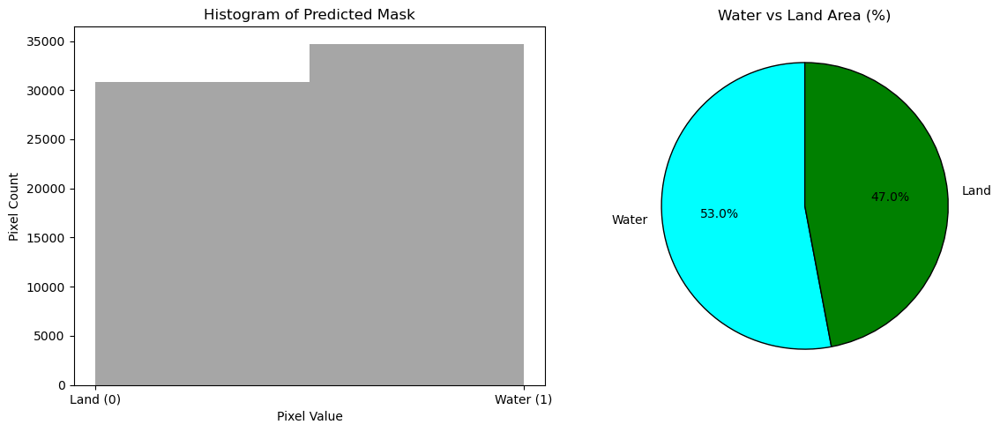

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# ====== Assuming pred_mask_binary already exists (from previous code) ======
# Shape: (256, 256), values: 0 (Land), 1 (Water)

# ====== Calculate Water and Land Pixels ======
total_pixels = pred_mask_binary.size
water_pixels = np.sum(pred_mask_binary == 1)
land_pixels = np.sum(pred_mask_binary == 0)

water_percent = (water_pixels / total_pixels) * 100
land_percent = (land_pixels / total_pixels) * 100

print(f"Water Percentage: {water_percent:.2f}%")
print(f"Land Percentage: {land_percent:.2f}%")

# ====== Histogram of Predicted Mask ======
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.hist(pred_mask_binary.ravel(), bins=2, color='gray', alpha=0.7)
plt.xticks([0, 1], ['Land (0)', 'Water (1)'])
plt.xlabel('Pixel Value')
plt.ylabel('Pixel Count')
plt.title('Histogram of Predicted Mask')

# ====== Pie Chart ======
plt.subplot(1, 2, 2)
plt.pie([water_percent, land_percent], labels=['Water', 'Land'], autopct='%1.1f%%',
        colors=['cyan', 'green'], startangle=90, wedgeprops=dict(edgecolor='black'))
plt.title('Water vs Land Area (%)')

plt.tight_layout()
plt.show()
